# ANÁLISIS EXPLORATORIO DE DATOS (EDA) DE AIRBNB EN MADRID

1. INTRODUCCIÓN AL ANÁLISIS

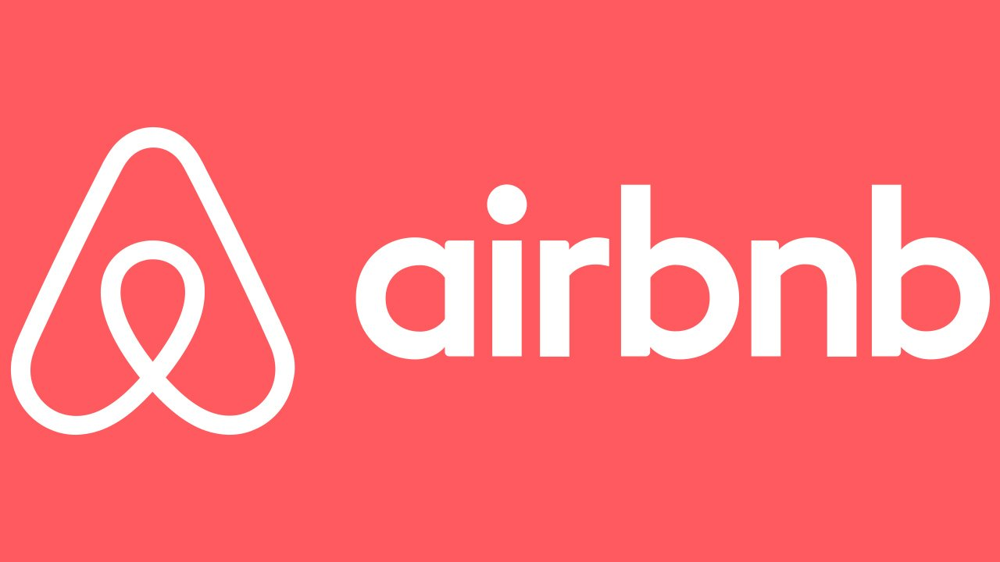

In [5]:
Image(filename='Airbnb-simbolo.jpg' , width=700)

¿Qué es Airbnb?

Airbnb es una compañía que ofrece una plataforma digital dedicada a la oferta de alojamientos particulares y turísticos (alquiler vacacional) mediante la cual los anfitriones pueden publicitar y contratar el arriendo de sus propiedades con sus huéspedes; anfitriones y huéspedes pueden valorarse mutuamente, como referencia para futuros usuarios.

Airbnb comenzó en la mente de tres emprendedores que han conseguido revolucionar la industria turística. La plataforma de alquiler, que comenzó en 2008, ya opera en más de 65 mil ciudades en las que más de 200 millones de huéspedes utilizan sus servicios. Sus anuncios superan los 3 millones en todo el mundo, lo que suponen actividades económicas importantes dentro del sector turístico.

In [2]:
from IPython.display import Image
import matplotlib.image as mpimg # para añadir imagen al gráfico

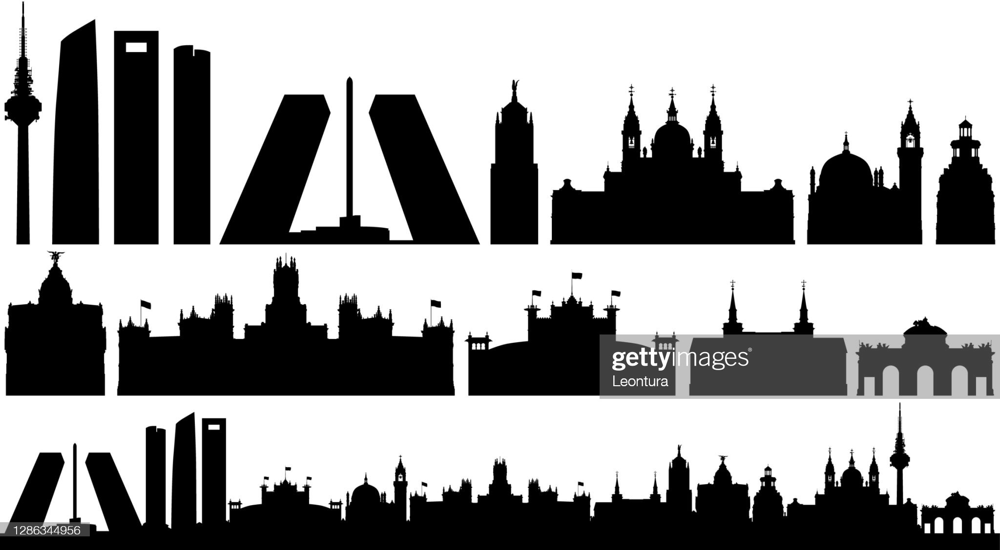

In [81]:
Image(filename='boceto.madrid.jpg' , width=1100) 

Imagen obtenida : gettyimages.com

DATOS RELEVANTES PARA PONERNOS EN CONTEXTO:

- Madrid, es la cuarta ciudad más atractiva del mundo para el turismo en 2022.

- El número de turistas que llegaron a Madrid hasta noviembre de 2022 fue alrededor de 5,6 millones.

¿ Qué relación guarda Airbnb en estas cifras y qué impacto tiene en Madrid el auge de la plataforma ?

2. RECOPILACIÓN Y CARGA DE DATOS

# Importar librerias

Pandas, numpy y seaborn

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns

# Cargar los anuncios de AirBnb

In [7]:
# Leemos el csv y lo convertimos en dataframe:

madrid=pd.read_csv(r"C:\VSCode\samplerepo\MÓDULO 2\20-Trabajo Módulo 2\datos\airbnb_anuncios.csv")

3. CONTENIDO DE LOS DATOS

# Contenido del dataset y análisis de las columnas

No siempre tendremos una descripción de las columnas. Análisis con los siguientes comandos: `shape`, `dtypes` e `info`.

In [8]:
madrid.shape

(20837, 16)

In [9]:
madrid.head(3)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room with ensuite bathroom, Airc.",13660,Simon,Chamartín,Hispanoamérica,40.45628,-3.67763,Private room,70,1,65,2019-09-04,0.56,1,53
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40341,-3.74084,Private room,17,4,33,2018-07-15,0.55,2,48
2,24805,Gran Via Studio Madrid,101471,Iraido,Centro,Universidad,40.42202,-3.70395,Entire home/apt,80,5,2,2017-07-03,0.03,1,354


In [10]:
madrid.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [11]:
madrid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20837 entries, 0 to 20836
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20837 non-null  int64  
 1   name                            20832 non-null  object 
 2   host_id                         20837 non-null  int64  
 3   host_name                       20822 non-null  object 
 4   neighbourhood_group             20837 non-null  object 
 5   neighbourhood                   20837 non-null  object 
 6   latitude                        20837 non-null  float64
 7   longitude                       20837 non-null  float64
 8   room_type                       20837 non-null  object 
 9   price                           20837 non-null  int64  
 10  minimum_nights                  20837 non-null  int64  
 11  number_of_reviews               20837 non-null  int64  
 12  last_review                     

OVERVIEW :

In [22]:
import pandas_profiling  
from pandas_profiling.utils.cache import cache_file # para tener un overview de nuestros datos

In [23]:
report = madrid.profile_report() # filtramos el report del df
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

4. LIMPIEZA DE DATOS

# Valores duplicados

Analizamos  los valores duplicados por las columnas.

Usamos el comando `duplicated` junto con `sum`.

En esta ocasión quitamos los valores duplicados con `drop_duplicates`.

Buscamos valores duplicados en todo el dataset :

In [12]:
madrid.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
20832    False
20833    False
20834    False
20835    False
20836    False
Length: 20837, dtype: bool

In [13]:
madrid.duplicated().sum() # no hay duplicados en columnas distintas.

0

In [14]:
madrid.drop_duplicates(inplace=True) # no obstante, eliminamos si los hubiera

# Comprobamos los valores nulos

Para ello usamos `isnull` junto con `sum`.

In [15]:
madrid.isnull().sum() # comprobamos los valores nulos por columna

id                                   0
name                                 5
host_id                              0
host_name                           15
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       4654
reviews_per_month                 4654
calculated_host_listings_count       0
availability_365                     0
dtype: int64

In [16]:
madrid.isnull().sum() *100/ len(madrid)  # comprobamos el % de valores nulos por columna

id                                 0.000000
name                               0.023996
host_id                            0.000000
host_name                          0.071987
neighbourhood_group                0.000000
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       22.335269
reviews_per_month                 22.335269
calculated_host_listings_count     0.000000
availability_365                   0.000000
dtype: float64

# Limpieza de columnas

Eliminamos las columnas `nombre`, `id`, `host_name` y `last_review`.

In [17]:
madrid = madrid.drop(['name', 'id', 'host_name', 'last_review'], axis=1) # eliminamos las columnas indicadas y salvamnos el nuevo df
madrid

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,13660,Chamartín,Hispanoamérica,40.45628,-3.67763,Private room,70,1,65,0.56,1,53
1,83531,Latina,Cármenes,40.40341,-3.74084,Private room,17,4,33,0.55,2,48
2,101471,Centro,Universidad,40.42202,-3.70395,Entire home/apt,80,5,2,0.03,1,354
3,101653,Centro,Justicia,40.41995,-3.69764,Entire home/apt,115,3,64,0.63,1,301
4,114340,Arganzuela,Legazpi,40.38985,-3.69011,Private room,25,2,136,1.19,1,337
...,...,...,...,...,...,...,...,...,...,...,...,...
20832,226958922,Chamartín,Castilla,40.47847,-3.68395,Entire home/apt,100,1,0,NaN,4,108
20833,178608863,Puente de Vallecas,Palomeras Sureste,40.38533,-3.63968,Private room,24,2,0,NaN,4,74
20834,182062359,Centro,Universidad,40.42182,-3.70336,Entire home/apt,75,2,0,NaN,2,196
20835,31425029,Centro,Embajadores,40.40896,-3.70107,Entire home/apt,45,2,0,NaN,1,104


In [18]:
madrid.columns.tolist() # nos hemos quedado con 12 de las 16 columnas

['host_id',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

# Análisis de los barrios

Analizamos la columna `neighbourhood_group` y conteamos los valores. Usamos el parámetro `normalize` con valores `True` o `False` para ver su utilidad.


In [19]:
madrid['neighbourhood_group'].value_counts() # comprobamos los valores de la columna 'neighbourhood_group'

Centro                   9773
Salamanca                1375
Chamberí                 1331
Arganzuela               1121
Tetuán                    838
Carabanchel               678
Retiro                    665
Latina                    616
Ciudad Lineal             613
Puente de Vallecas        591
Chamartín                 551
Moncloa - Aravaca         542
San Blas - Canillejas     524
Usera                     361
Hortaleza                 332
Fuencarral - El Pardo     300
Villaverde                166
Barajas                   165
Moratalaz                 127
Villa de Vallecas         103
Vicálvaro                  65
Name: neighbourhood_group, dtype: int64

In [20]:
madrid['neighbourhood_group'].nunique() # tenemos 21 barrios en Madrid 

21

In [21]:
madrid['neighbourhood_group'].value_counts(normalize=True) # si indicamos 'False' tenemos el conteo anterior de barrios. 

# Aquí podemos ver los valores únicos en la columna 'neighbourhood_group' y su proporción en la columna. 

Centro                   0.469021
Salamanca                0.065988
Chamberí                 0.063877
Arganzuela               0.053799
Tetuán                   0.040217
Carabanchel              0.032538
Retiro                   0.031914
Latina                   0.029563
Ciudad Lineal            0.029419
Puente de Vallecas       0.028363
Chamartín                0.026443
Moncloa - Aravaca        0.026011
San Blas - Canillejas    0.025148
Usera                    0.017325
Hortaleza                0.015933
Fuencarral - El Pardo    0.014397
Villaverde               0.007967
Barajas                  0.007919
Moratalaz                0.006095
Villa de Vallecas        0.004943
Vicálvaro                0.003119
Name: neighbourhood_group, dtype: float64

# Sección

Descripción `shape`, `dtypes` e `info`.

Comprobamos ahora el contenido de nuestros datos:

In [22]:
madrid.shape

(20837, 12)

In [23]:
madrid.dtypes

host_id                             int64
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [24]:
madrid.info() # ya podemos ver los valores nulos en 'reviews_per_month'

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20837 entries, 0 to 20836
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_id                         20837 non-null  int64  
 1   neighbourhood_group             20837 non-null  object 
 2   neighbourhood                   20837 non-null  object 
 3   latitude                        20837 non-null  float64
 4   longitude                       20837 non-null  float64
 5   room_type                       20837 non-null  object 
 6   price                           20837 non-null  int64  
 7   minimum_nights                  20837 non-null  int64  
 8   number_of_reviews               20837 non-null  int64  
 9   reviews_per_month               16183 non-null  float64
 10  calculated_host_listings_count  20837 non-null  int64  
 11  availability_365                20837 non-null  int64  
dtypes: float64(3), int64(6), object(

# Tratamiento de la columna `reviews_per_month`

Ponemos a 0 aquellos valores nulos de la columna con el comando `fillna`.

Comprobamos nulos en la columna 'reviews_per_month':

In [25]:
madrid['reviews_per_month'].isnull().sum() # como vimos antes tenemos valores nulos en esta columna

4654

In [26]:
madrid['reviews_per_month'].isnull().sum()*100/ len(madrid) # comprobamos el % de nulos en la columna, un 22 %

22.33526899265729

Comprobamos el tipo de dato de la columna:

In [27]:
madrid['reviews_per_month'] # vemos que contiene un dato tipo 'float'

0        0.56
1        0.55
2        0.03
3        0.63
4        1.19
         ... 
20832     NaN
20833     NaN
20834     NaN
20835     NaN
20836     NaN
Name: reviews_per_month, Length: 20837, dtype: float64

Como la columna 'reviews_per_month' contiene una variable cuantitativa numérica, vamos a reemplazar los valores nulos por cero :

In [28]:
madrid['reviews_per_month']=madrid['reviews_per_month'].fillna(0)  # sustituimos por cero 
madrid['reviews_per_month'].isnull().sum() # comprobamos nulos

0

# Quitamos aquellos valores nulos de las columnas restantes


Comprobamos que ya no tenemos valores nulos :

In [29]:
madrid.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20837 entries, 0 to 20836
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_id                         20837 non-null  int64  
 1   neighbourhood_group             20837 non-null  object 
 2   neighbourhood                   20837 non-null  object 
 3   latitude                        20837 non-null  float64
 4   longitude                       20837 non-null  float64
 5   room_type                       20837 non-null  object 
 6   price                           20837 non-null  int64  
 7   minimum_nights                  20837 non-null  int64  
 8   number_of_reviews               20837 non-null  int64  
 9   reviews_per_month               20837 non-null  float64
 10  calculated_host_listings_count  20837 non-null  int64  
 11  availability_365                20837 non-null  int64  
dtypes: float64(3), int64(6), object(

In [30]:
madrid.isnull().sum()

host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

5. ANÁLISIS

# Usamos el comando `describe` para ver el estado de los datos



In [31]:
madrid.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,2.083700e+04,20837.000000,20837.000000,20837.000000,20837.000000,20837.000000,20837.000000,20837.000000,20837.000000
mean,1.014144e+08,40.420548,-3.694500,134.065364,4.373614,35.163891,1.521432,12.188559,155.097567
std,8.956078e+07,0.021881,0.027793,381.207575,20.428777,61.863053,1.916618,32.156130,133.746263
min,5.154000e+03,40.319480,-3.890940,8.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,2.232182e+07,40.409550,-3.707490,40.000000,1.000000,1.000000,0.070000,1.000000,17.000000
50%,7.574288e+07,40.418900,-3.701180,65.000000,2.000000,8.000000,0.750000,2.000000,123.000000
75%,1.719263e+08,40.429020,-3.689110,100.000000,3.000000,42.000000,2.360000,7.000000,300.000000
max,2.960847e+08,40.573990,-3.527660,9999.000000,1125.000000,594.000000,34.230000,231.000000,365.000000


# Análisis de la correlación de las variables

Usamos el comando `corr` y de Seaborn usamos `heatmap` para respresentarlo.

Importamos la librería `matplotlib` para facilitar la representación de los futuros gráficos.

`import matplotlib.pyplot as plt`

 **¿Qué observamos con las correlaciones?**

In [32]:
import matplotlib.pyplot as plt

# para evitar errores escritos en gráficos 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

Realizamos un gráfico 'mapa de calor' aplicando el método de correlación de Kendall para medir las relaciones entre dos variables (entre 1 y -1):

Index(['host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

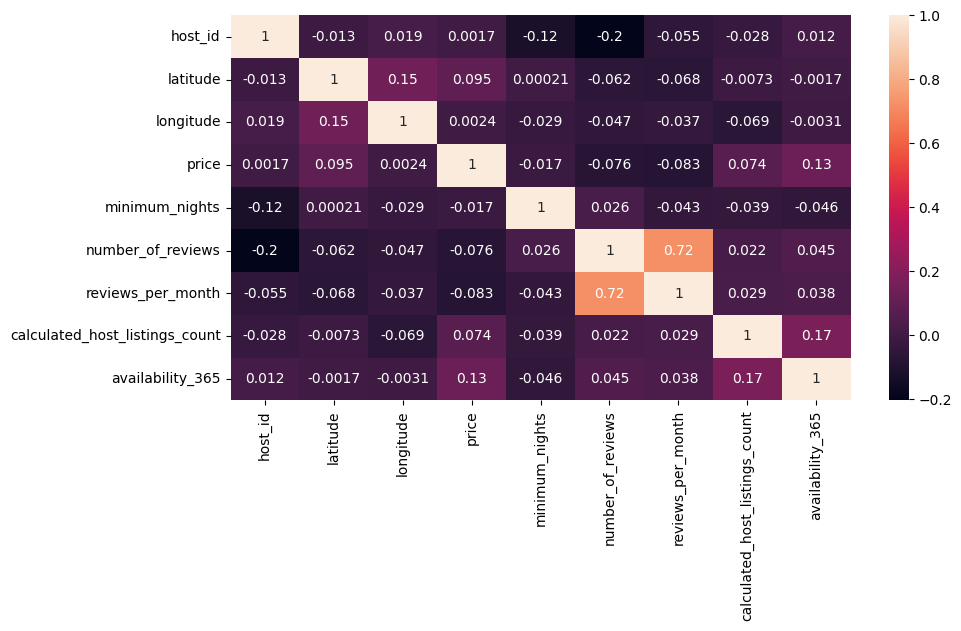

In [33]:
plt.figure(figsize=(10,5))
sns.heatmap(madrid.corr(method='kendall'),annot=True);

madrid.columns # para ver el listado de columnas antes del gráfico

Una correlación positiva (1) significa que a medida que aumenta una variable, también aumenta la otra. Una correlación negativa (-1) significa que a medida que aumenta una variable, la otra disminuye.

Podemos verlo en las variables 'number_of_reviews' y 'reviews_per_month' , están correlacionadas de forma positiva (0.72) , cuando una aumenta lo hace también la otra; mientras que en las variables 'host_id' y 'number_of_reviews' vemos que las variables están correlacionadas de forma negativa (-0.2), es decir, a medida que aumenta una, la otra disminuye.

# Identificamos los barrios del dataset

Usamos el comando `unique` en la columna `neighbourhood_group`.

In [35]:
madrid['neighbourhood_group'].unique() # como vimos antes, tenemos 21 barrios en Madrid.

array(['Chamartín', 'Latina', 'Centro', 'Arganzuela', 'Salamanca',
       'Tetuán', 'Fuencarral - El Pardo', 'Ciudad Lineal', 'Chamberí',
       'Villaverde', 'Hortaleza', 'Moncloa - Aravaca', 'Carabanchel',
       'Retiro', 'San Blas - Canillejas', 'Villa de Vallecas', 'Barajas',
       'Usera', 'Puente de Vallecas', 'Moratalaz', 'Vicálvaro'],
      dtype=object)

# Representamos los barrios y su importancia

Usamos `countplot` de `Seaborn` en la columna `neighbourhood_group`.

Representamos en un gráfico la cantidad de anuncios por distrito que tenemos :

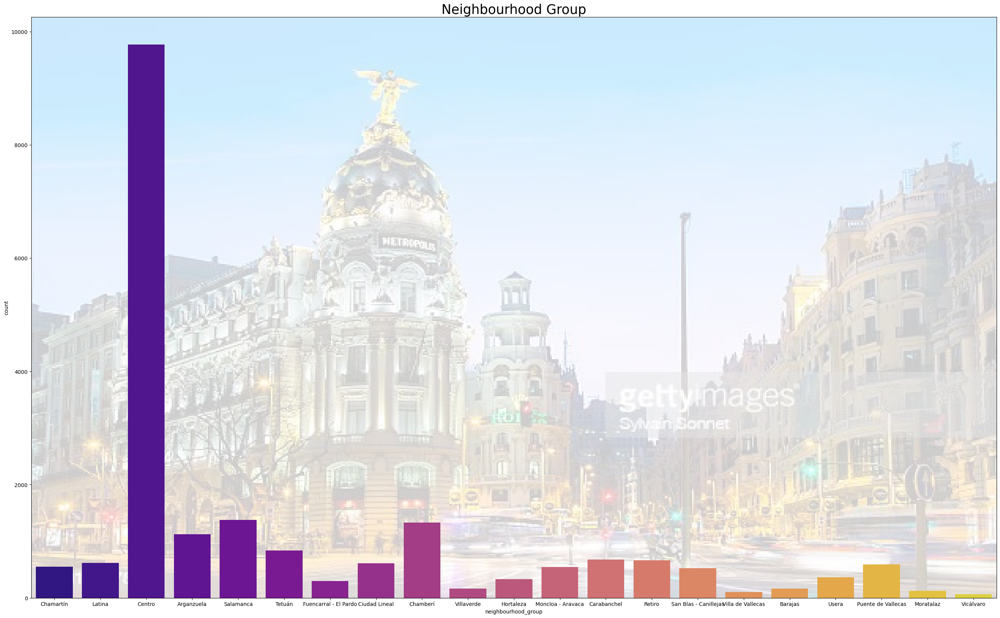

In [60]:
image = mpimg.imread('madrid.jpg')
fig, ax = plt.subplots()

sns.countplot(x=madrid['neighbourhood_group'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(33,20)
plt.title('Neighbourhood Group', fontsize=25)

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.2);

Imagen obtenida : gettyimages.com

Como podemos ver en el gráfico, donde más anuncios tenemos es en el distrito Centro, muy por encima del resto de distritos, lo que convierte el centro de Madrid en un conjunto de viviendas destinadas principalmente al uso turístico; seguidos de los distritos de Salamanca y Chamberí, distritos también muy cercanos al centro y con un alto poder adquisitivo, donde se concentran la mayoría de restaurantes y vida nocturna de la ciudad.

Y donde menos anuncios encontramos es en los distritos más alejados del centro y con mucha distancia incluso en transporte público, como Barajas, Moratalaz y Vicálvaro, siendo donde menos anuncios se publican los distritos de Villa de Vallecas y Villaverde, que son algunas de las zonas más humildes de la capital.

# Realizamos ahora una representación de los barrios por separado y sin agrupar.

Usamos `countplot` de `Seaborn` en la columna `neighbourhood`.

Vemos ahora un gráfico por anuncios publicados por barrios:

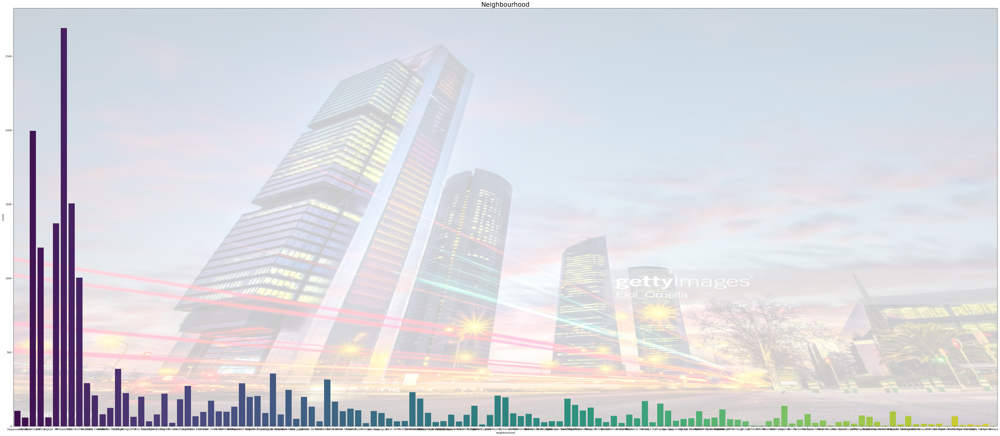

In [59]:
image = mpimg.imread('madrid2.jpg')
fig, ax = plt.subplots()

sns.countplot(x=madrid['neighbourhood'], palette="viridis") # modificamos la paleta de colores
fig = plt.gcf()
fig.set_size_inches(70,30)
plt.title('Neighbourhood', fontsize=25)

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.2);

Imagen obtenida : gettyimages.com

# Representamos los tipos de habitación que se ofertan

Usamos la columna `room_type`.

Vamos a ver ahora el tipo de habitaciones que ofertan los anuncios publicados:

In [41]:
madrid['room_type'].value_counts()

Entire home/apt    12583
Private room        7503
Hotel room           477
Shared room          274
Name: room_type, dtype: int64

Vemos que la mayoría de ellos son apartamentos y viviendas enteras, seguido de habitaciones privadas, en menor proporción hoteles y por último, habitaciones compartidas;
lo veremos mejor en el siguiente gráfico:

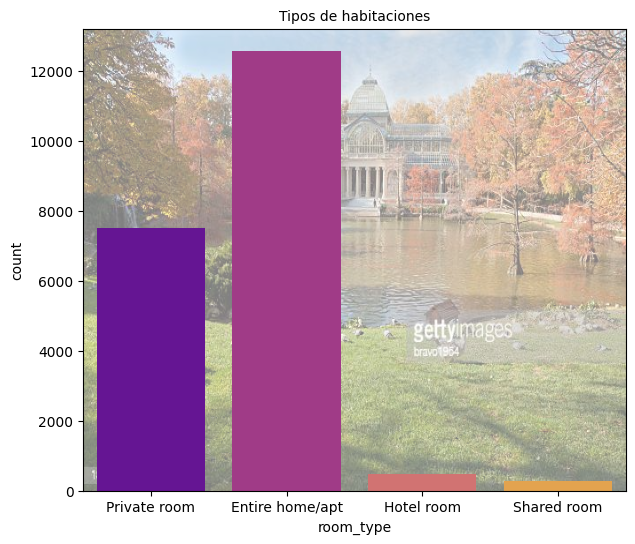

In [43]:
image = mpimg.imread('retiro.jpg')
fig, ax = plt.subplots()

sns.countplot(x=madrid['room_type'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(7,6)
plt.title('Tipos de habitaciones', fontsize=10);

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.5);

Imagen obtenida : gettyimages.com

# Relación entre la columna `neighbour_group` y `availability_365` que corresponde a la disponiblidad

 Usamos un `boxplot` de `sns`.
**¿Qué interpretamos?**

Vamos a ver ahora un gráfico boxplot para ver como se distribuyen las variables numéricas 'Neighbourhood Group' y 'availability_365'- disponibilidad,   para tener una idea general de cómo se distribuyen los datos:

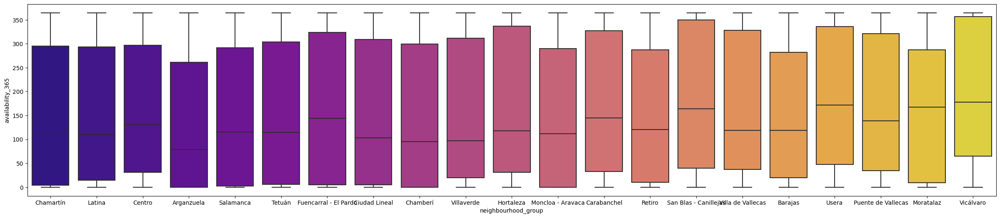

In [228]:
plt.figure(figsize=(30,6))
sns.boxplot(data=madrid, x='neighbourhood_group',y='availability_365',palette='plasma');

Este gráfico nos muestra la cantidad de valores que hay por encima y por debajo de los valores medios. También nos ayuda a identificar los valores atípicos y los outliers, que están fuera de la normalidad. 

# Realizamos un mapa de los grupos de barrios

Usamos un `scatterplot` de `sns`.

Para ello debemos aportar las columnas `longitude`, `latitude` y como `hue` aportamos la columna `neighbourhood_group`.


Vemos la distribución de anuncios por localización y distritos:

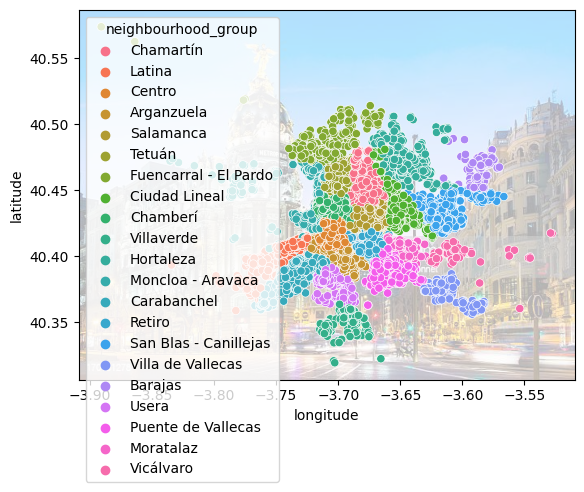

In [49]:
image = mpimg.imread('madrid.jpg')
fig, ax = plt.subplots()

sns.scatterplot(x=madrid ['longitude'],y= madrid['latitude'],hue=madrid['neighbourhood_group'])

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.3);

Imagen obtenida : gettyimages.com

# Realizamos el mapa anterior pero esta vez de los barrios

Siguiendo el comando anterior, usamos la columna `neighbourhood`.

Vemos ahora la distribución de anuncios por barrios y localización:

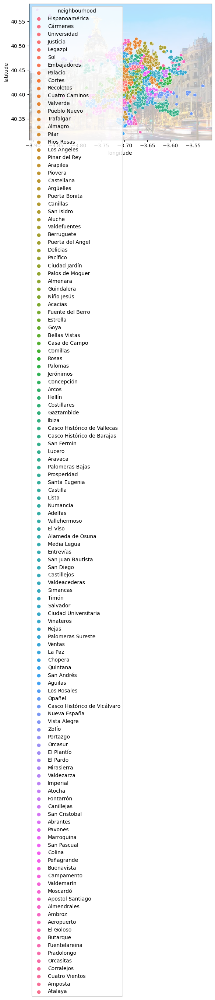

In [51]:
image = mpimg.imread('madrid.jpg')
fig, ax = plt.subplots()

sns.scatterplot(x=madrid ['longitude'],y= madrid['latitude'],hue=madrid['neighbourhood'])

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.3);

Imagen obtenida : gettyimages.com

# Creamos un mapa sobre el tipo de habitación por barrios

Esta vez, usamos la columna `room_type`.

**¿Qué indica el gráfico?**

A continucación, podemos ver como se distribuyen los tipos de habitaciones según la ubicación:

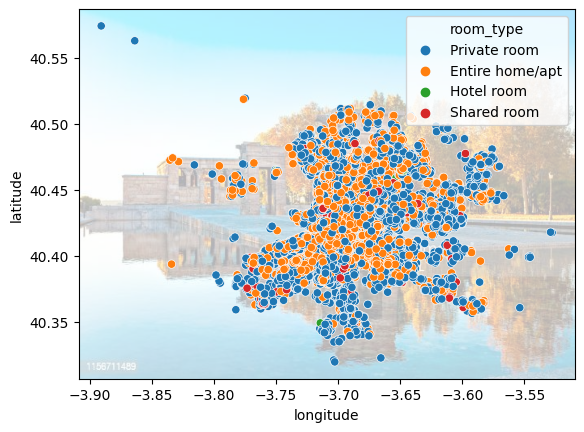

In [54]:
image = mpimg.imread('templodebod.jpg')
fig, ax = plt.subplots()

sns.scatterplot(x=madrid ['longitude'],y= madrid['latitude'],hue=madrid['room_type']);

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.3);

Imagen obtenida : gettyimages.com

Como ya anticipamos antes, en Madrid, Airbnb ofrece en su mayoría alojamientos en viviendas y apartamentos completos, siendo esto lo predominante que vemos en color naranja y mayormente distribuido por el centro; cuanto más nos alejamos de este, podemos ver que es donde se encuentran los anuncios que ofrecen habitaciones (en color azul) y algunas habitaciones compartidas (en rojo), guardando todo esto además, una estrecha relación con el precio.

# Disponibilidad de las habitaciones

Creamos un mapa para ver la disponibilidad de las habitaciones. 

Para ello usamos la columna `availability_365`.

Veamos ahora como se distribuye en Madrid la disponibilidad de las habitaciones ofertadas:

In [55]:
madrid.head(3) # comprobamos que datos nos facilita la columna 'availability_365', vemos que indica el número de noches disponibles por año.

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,13660,Chamartín,Hispanoamérica,40.45628,-3.67763,Private room,70,1,65,0.56,1,53
1,83531,Latina,Cármenes,40.40341,-3.74084,Private room,17,4,33,0.55,2,48
2,101471,Centro,Universidad,40.42202,-3.70395,Entire home/apt,80,5,2,0.03,1,354


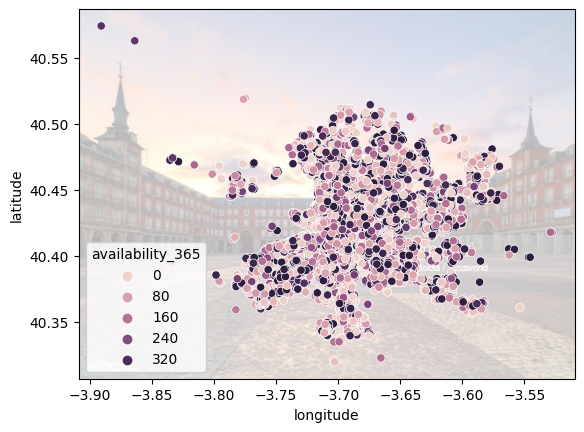

In [58]:
image = mpimg.imread('plazamayor.jpg')
fig, ax = plt.subplots()

sns.scatterplot(x=madrid ['longitude'],y= madrid['latitude'],hue=madrid['availability_365'])

x0,x1 = ax.get_xlim()
y0,y1 = ax.get_ylim()
ax.imshow(image, extent=[x0, x1, y0, y1], aspect='auto', alpha=0.3);

Imagen obtenida : gettyimages.com

Podemos ver como los anuncios con mayor disponibilidad los tenemos en morado, hay tantas habitaciones ocupadas como disponibles, por la gran oferta que ofrece Airbnb en Madrid.

Para finalizar esta parte del análisis, podemos ver reflejados en los siguientes dibujos, los nombres de los distintos distritos y barrios de Madrid:

In [30]:
from wordcloud import WordCloud # para generar un gráfico de palabras

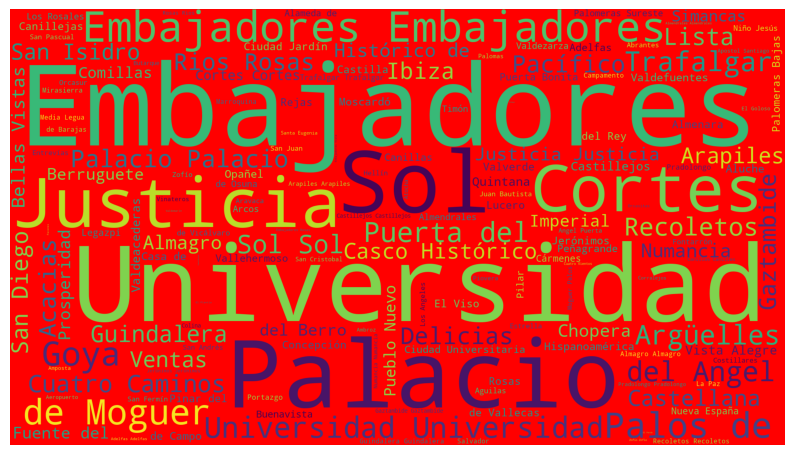

In [44]:
plt.subplots(figsize=(10,15))
wordcloud = WordCloud(background_color='red',width=1920,height=1080).generate(" ".join(madrid['neighbourhood']))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('neighbourhood.png')
plt.show()

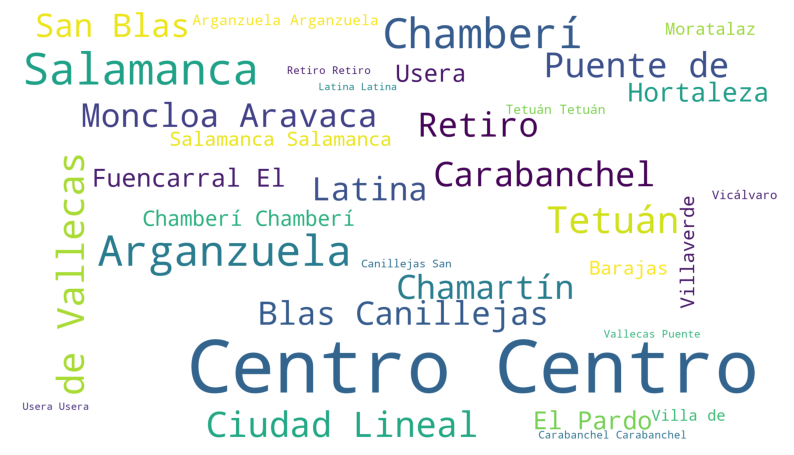

In [45]:
plt.subplots(figsize=(10,15))
wordcloud = WordCloud(background_color='white',width=1920,height=1080).generate(" ".join(madrid['neighbourhood_group']))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('neighbourhood_group.png')
plt.show()

6. CONCLUSIONES

Millones de personas utilizan Airbnb cuando viajan, pero su popularidad en ocasiones crea conflictos con los vecinos, por ello, las grandes ciudades luchan contra Airbnb con regulaciones para frenar el aumento de los alquileres a corto plazo.

En lo que respecta a Madrid, pocos edificios quedan en el centro sin un anuncio en la plataforma; los datos del portal en 2022, indican que tan solo en el centro de Madrid hay 8.300 anuncios de un total de 18.310 que hay en toda la ciudad.

En Madrid, una muy pequeña parte de usuarios controlan la gran mayoría de las ofertas; lo que comenzó como premisa principal de Airbnb, que buscaba ser una solución para que personas individuales pudieran ofrecer su domicilio a posibles turistas, se ha convertido en un negocio muy lucrativo.



Para continuar el ejercicio en Power BI , salvamos en formato csv el dataset ya modificado :

In [ ]:
madrid.to_csv("madrid_airbnb_pbi.csv")